# Choose the target class that you want the perturbed stop sign to be detected as

In [0]:
TARGET_CLASS = "16: bird" #@param ["1: person", "2: bicycle", "3: car", "4: motorcycle", "5: airplane", "6: bus", "7: train", "8: truck", "9: boat", "10: traffic light", "11: fire hydrant", "13: stop sign", "14: parking meter", "15: bench", "16: bird", "17: cat", "18: dog", "19: horse", "20: sheep", "21: cow", "22: elephant", "23: bear", "24: zebra", "25: giraffe", "27: backpack", "28: umbrella", "31: handbag", "32: tie", "33: suitcase", "34: frisbee", "35: skis", "36: snowboard", "37: sports ball", "38: kite", "39: baseball bat", "40: baseball glove", "41: skateboard", "42: surfboard", "43: tennis racket", "44: bottle", "46: wine glass", "47: cup", "48: fork", "49: knife", "50: spoon", "51: bowl", "52: banana", "53: apple", "54: sandwich", "55: orange", "56: broccoli", "57: carrot", "58: hot dog", "59: pizza", "60: donut", "61: cake", "62: chair", "63: couch", "64: potted plant", "65: bed", "67: dining table", "70: toilet", "72: tv", "73: laptop", "74: mouse", "75: remote", "76: keyboard", "77: cell phone", "78: microwave", "79: oven", "80: toaster", "81: sink", "82: refrigerator", "84: book", "85: clock", "86: vase", "87: scissors", "88: teddy bear", "89: hair drier", "90: toothbrush"]
TARGET_CLASS = int(TARGET_CLASS.split(':', 1)[0])

# Install dependencies

In [2]:
!apt-get install -y -qq protobuf-compiler python-pil python-lxml
!git clone --quiet https://github.com/tensorflow/models.git
 
import os
os.chdir('models/research')
!protoc object_detection/protos/*.proto --python_out=.

import sys
sys.path.append('/content/models/research/slim')

fatal: destination path 'models' already exists and is not an empty directory.


# Import libraries

In [3]:
import time
import math
import tarfile
import zipfile
import PIL.Image
import numpy as np
import tensorflow as tf
import six.moves.urllib as urllib

from cStringIO import StringIO
from IPython.display import clear_output, Image, display, HTML
from object_detection.utils import label_map_util
from object_detection.utils.visualization_utils import visualize_boxes_and_labels_on_image_array
from object_detection.core import target_assigner

object_detection/utils/visualization_utils.py:29: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/usr/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/usr/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python2.7/dist-packages/traitlets/config/application.py", line 657, in launch_instance
    app.initialize(argv)
  File "</usr/local/lib/python2.7/dist-packages/decorator.pyc:decorator-gen-121>", line 2, in initialize
  File "/usr/local/lib/python2.7/dist-packages/traitlets/con

# Model preparation

In [0]:
DATA_DIR = 'https://github.com/r3a2t10/robust-physical-attack/raw/master/data/'
MODEL_NAME = 'faster_rcnn_inception_v2_coco_2017_11_08'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'mscoco_label_map.pbtxt'

NUM_CLASSES = 90

# Download Faster R-CNN model

In [0]:
opener = urllib.request.URLopener()
opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
tar_file = tarfile.open(MODEL_FILE)
for file in tar_file.getmembers():
  file_name = os.path.basename(file.name)
  if 'frozen_inference_graph.pb' in file_name:
    tar_file.extract(file, os.getcwd())

# Load label map

In [6]:
urllib.request.urlretrieve(DATA_DIR+PATH_TO_LABELS, PATH_TO_LABELS)
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

W1230 09:29:31.845901 140696097863552 module_wrapper.py:139] From object_detection/utils/label_map_util.py:138: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.



# Utility functions for loading and displaying images

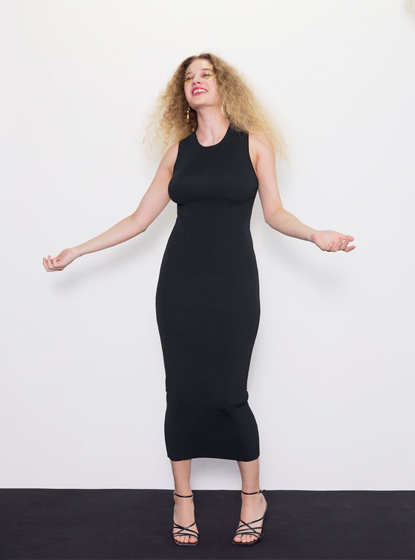

In [7]:
def read_image(path):
    img = PIL.Image.open(path)
    img = np.array(img, dtype=np.uint8)
    return img

def showarray(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))


#IMG_NAME = 'img_stop_sign.png'
IMG_NAME = 'zara.jpg'
urllib.request.urlretrieve(DATA_DIR+IMG_NAME, IMG_NAME)
img = read_image(IMG_NAME)
showarray(img)

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load the model for inference

In [0]:
inference_graph = tf.Graph()
with inference_graph.as_default():
    image_tensor = tf.placeholder(tf.float32, shape=(None, None, None, 3), name='image_tensor')
    inference_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        inference_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(inference_graph_def, name='',
                            input_map={'Preprocessor/map/TensorArrayStack/TensorArrayGatherV3:0':image_tensor})

# Define the plotting utility function

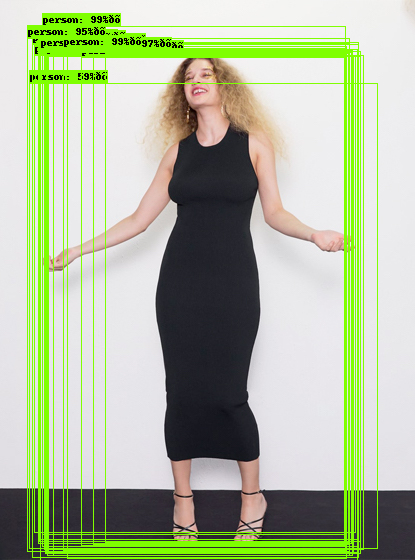

In [10]:
def plot_detections(img, scores=None, bboxes=None, min_threshold=0):
    if scores is None or bboxes is None:
        
        inference_sess = tf.Session(graph=inference_graph)

        tensors = [ inference_graph.get_tensor_by_name('detection_boxes:0'),
                    inference_graph.get_tensor_by_name('detection_scores:0'),
                    inference_graph.get_tensor_by_name('detection_classes:0'),
                    inference_graph.get_tensor_by_name('num_detections:0'),
                    inference_graph.get_tensor_by_name('SecondStagePostprocessor/Reshape_4:0'),
                    inference_graph.get_tensor_by_name('SecondStagePostprocessor/convert_scores:0') ]

        feed_dict = { inference_graph.get_tensor_by_name('image_tensor:0'): np.expand_dims(img, axis=0) }

        nms_bboxes, nms_scores, nms_classes, num_detections, bboxes, scores = inference_sess.run(tensors,
                                                                                                 feed_dict)
        
        bboxes = bboxes[0]
        scores = scores[0]
    
    sorted_classes = np.argsort(scores[:, 1:], axis=1)
    sorted_scores = scores[:, 1:].copy()
    sorted_bboxes = bboxes.copy()

    for i, ordering in enumerate(sorted_classes):
        sorted_scores[i, :] = scores[i, ordering+1]
        sorted_bboxes[i, :] = bboxes[i, ordering, :]

    sorted_classes += 1

    img_viz = visualize_boxes_and_labels_on_image_array(img.copy(), 
                                                        sorted_bboxes[:, -1, :],
                                                        sorted_classes[:, -1].astype(np.int32),
                                                        sorted_scores[:, -1],
                                                        category_index,
                                                        use_normalized_coordinates=False,
                                                        max_boxes_to_draw=sorted_scores.shape[1],
                                                        min_score_thresh=min_threshold,
                                                        line_thickness=1)
    showarray(img_viz)

plot_detections(img, min_threshold=0.5)

# Load the mask

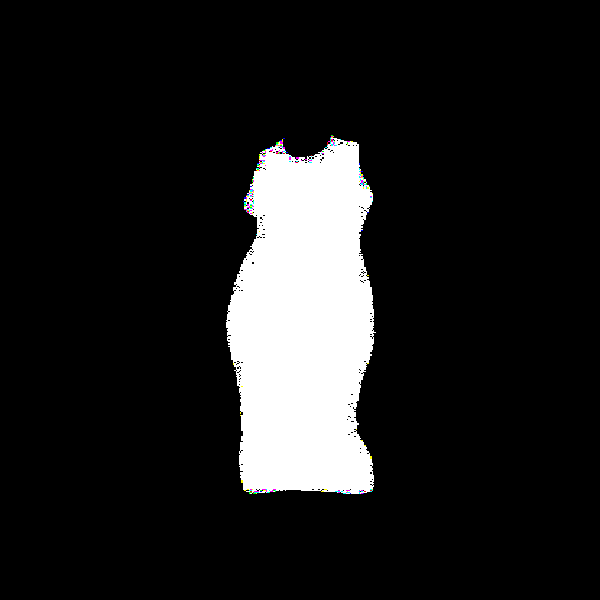

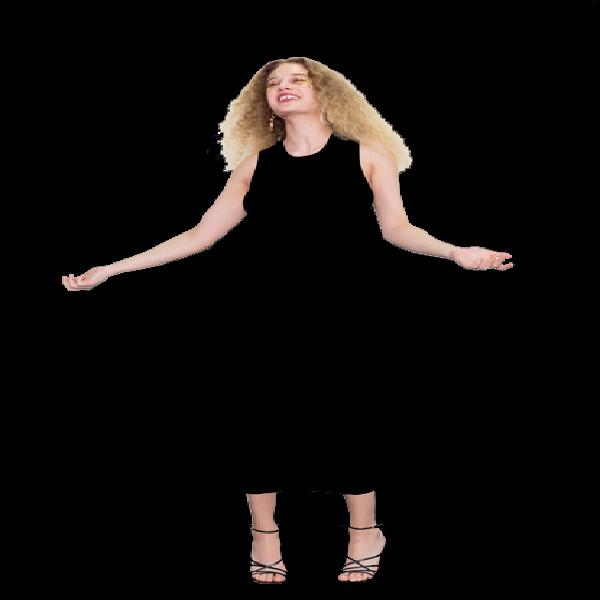

In [11]:
psize  = 600
psizeX = 600
psizeY = 600
a = 'zara_white.jpg'
urllib.request.urlretrieve(DATA_DIR+a, a)
img = np.asarray(read_image(a))
RED_MASK = np.array(PIL.Image.fromarray(img).resize((psizeX, psizeY)))/255
showarray(255*RED_MASK)

a = 'zara_color.jpg'
urllib.request.urlretrieve(DATA_DIR+a, a)
img = np.asarray(read_image(a))
WHITE_MASK = np.array(PIL.Image.fromarray(img).resize((psizeX, psizeY)))
showarray(WHITE_MASK)

In [12]:
'''
psize = 600
RED_MASK_NAME = 'stop_red_mask.npy'
urllib.request.urlretrieve(DATA_DIR+RED_MASK_NAME, RED_MASK_NAME)
RED_MASK = np.array(PIL.Image.fromarray(np.load(RED_MASK_NAME)).resize((psize, psize)))
showarray(255*RED_MASK)

WHITE_MASK_NAME = 'stop_white_mask.npy'
urllib.request.urlretrieve(DATA_DIR+WHITE_MASK_NAME, WHITE_MASK_NAME)
WHITE_MASK = np.array(PIL.Image.fromarray(np.load(WHITE_MASK_NAME)).resize((psize, psize)))
showarray(255*WHITE_MASK)
'''

"\npsize = 600\nRED_MASK_NAME = 'stop_red_mask.npy'\nurllib.request.urlretrieve(DATA_DIR+RED_MASK_NAME, RED_MASK_NAME)\nRED_MASK = np.array(PIL.Image.fromarray(np.load(RED_MASK_NAME)).resize((psize, psize)))\nshowarray(255*RED_MASK)\n\nWHITE_MASK_NAME = 'stop_white_mask.npy'\nurllib.request.urlretrieve(DATA_DIR+WHITE_MASK_NAME, WHITE_MASK_NAME)\nWHITE_MASK = np.array(PIL.Image.fromarray(np.load(WHITE_MASK_NAME)).resize((psize, psize)))\nshowarray(255*WHITE_MASK)\n"

# Define the optimization model

In [13]:
class ModelContainer():
    def __init__(self):
        self.graph = tf.Graph()
        self.sess = tf.Session(graph=self.graph)
        self.patch_shape = (psize, psize, 3)
        self.batch_size_ = 10
        self._make_model_and_ops(None)

    def get_patch(self):
        patch = np.round((self._run(self.clipped_patch_)+1)*(255/2.0)).astype(np.uint8)
        patch *= RED_MASK
        patch[patch == 0] = 255
        return patch

    def assign_patch(self, new_patch):
        self._run(self.assign_patch_, {self.patch_placeholder_: new_patch})

    def reset_patch(self):
        self.assign_patch(np.zeros(self.patch_shape))
          
    def train_step(self, images, patch_transforms, second_stage_cls_labels, learning_rate=1.0,
                   dropout=None, rpn_nms_bboxes=None, rpn_nms_indices=None, patch_loss_weight=None):
        if (rpn_nms_bboxes is None) or \
           (rpn_nms_indices is None):
            rpn_nms_bboxes, rpn_nms_indices = self.inference_rpn(images, patch_transforms)

        feed_dict = { self.image_input_: images,
                      self.patch_transforms_: patch_transforms,
                      self.second_stage_cls_labels_: second_stage_cls_labels,
                      self.rpn_nms_bboxes_placeholder_: rpn_nms_bboxes,
                      self.rpn_nms_indices_placeholder_: rpn_nms_indices,
                      self.learning_rate_: learning_rate }
        
        if patch_loss_weight is not None:
            feed_dict[self.patch_loss_weight_] = patch_loss_weight
        
        tensors = [ self.train_op_,
                    self.loss_,
                    self.second_stage_cls_loss_, 
                    self.patch_loss_]

        train_op, loss, second_stage_cls_loss, patch_loss = self._run(tensors, feed_dict, dropout=dropout)

        return loss, second_stage_cls_loss, patch_loss
    
    def inference_rpn(self, images, patch_transforms):
        feed_dict = { self.image_input_: images,
                      self.patch_transforms_: patch_transforms }
        
        tensors = [self.rpn_nms_bboxes_,
                   self.rpn_nms_indices_ ]

        rpn_nms_bboxes, rpn_nms_indices = self._run(tensors, feed_dict)
        
        return rpn_nms_bboxes, rpn_nms_indices

    def inference(self, images, patch_transforms, rpn_nms_bboxes=None, rpn_nms_indices=None):
        if (rpn_nms_bboxes is None) or \
           (rpn_nms_indices is None):
            rpn_nms_bboxes, rpn_nms_indices = self.inference_rpn(images, patch_transforms)

        feed_dict = { self.image_input_: images,
                      self.patch_transforms_: patch_transforms,
                      self.rpn_nms_bboxes_placeholder_: rpn_nms_bboxes,
                      self.rpn_nms_indices_placeholder_: rpn_nms_indices }

        tensors = [ self.patched_input_,
                    self.second_stage_cls_scores_,
                    self.second_stage_loc_bboxes_ ]

        patched_imgs, second_stage_cls_scores, second_stage_loc_bboxes = self._run(tensors, feed_dict)
        patched_imgs = patched_imgs.astype(np.uint8)

        plot_detections(patched_imgs[0], scores=second_stage_cls_scores[0], bboxes=second_stage_loc_bboxes[0], min_threshold=0.2)
        
        return patched_imgs, second_stage_cls_scores, second_stage_loc_bboxes

    def _run(self, target, feed_dict=None, dropout=None):
        if feed_dict is None:
            feed_dict = {}
         
        if dropout is not None:
            feed_dict[self.dropout_] = dropout
    
        return self.sess.run(target, feed_dict=feed_dict)
    
    def _make_model_and_ops(self, patch_val):
        start = time.time()
        with self.sess.graph.as_default():
            tf.set_random_seed(1234)
            
            # Tensors are post-fixed with an underscore!
            self.image_input_ = tf.placeholder(tf.float32, shape=(None, psize, psize, 3), name='image_input')
            self.patch_transforms_ = tf.placeholder(tf.float32, shape=(None, 8), name='patch_transforms')

            patch_ = tf.get_variable('patch', self.patch_shape, dtype=tf.float32, initializer=tf.zeros_initializer)
            self.patch_placeholder_ = tf.placeholder(dtype=tf.float32, shape=self.patch_shape, name='patch_placeholder')
            self.assign_patch_ = tf.assign(patch_, self.patch_placeholder_)
            self.clipped_patch_ = tf.tanh(patch_)

            self.dropout_ = tf.placeholder_with_default(1.0, [], name='dropout')
            patch_with_dropout_ = tf.nn.dropout(self.clipped_patch_, keep_prob=self.dropout_)
            patched_input_ = tf.clip_by_value(self._random_overlay(self.image_input_, patch_with_dropout_), clip_value_min=-1.0, clip_value_max=1.0)
            patched_input_ = tf.clip_by_value(tf.image.random_brightness(patched_input_, 10.0/255), -1.0, 1.0)
            self.patched_input_ = tf.fake_quant_with_min_max_vars((patched_input_ + 1)*127.5, min=0, max=255)

            # Create placeholders for NMS RPN inputs
            self.rpn_nms_bboxes_placeholder_ = tf.placeholder(tf.float32, shape=(None, 4), name='rpn_nms_bboxes')
            self.rpn_nms_indices_placeholder_ = tf.placeholder(tf.int32, shape=(None), name='rpn_nms_indices')

            detection_graph_def = tf.GraphDef()
            with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
                serialized_graph = fid.read()
                detection_graph_def.ParseFromString(serialized_graph)
                tf.import_graph_def(detection_graph_def, name='detection',
                                    input_map={
                                               'Preprocessor/map/TensorArrayStack/TensorArrayGatherV3:0':self.patched_input_,
                                               'Reshape_7:0':self.rpn_nms_bboxes_placeholder_,
                                               'Reshape_8:0':self.rpn_nms_indices_placeholder_,
                                              })

            # Recreate tensors we just replaced in the input_map
            self.rpn_nms_bboxes_ = tf.reshape(self.graph.get_tensor_by_name('detection/Reshape_6:0'), self.graph.get_tensor_by_name('detection/stack_3:0'), name='detection/Reshape_7')
            self.rpn_nms_indices_ = tf.reshape(self.graph.get_tensor_by_name('detection/mul_1:0'), self.graph.get_tensor_by_name('detection/Reshape_8/shape:0'), name='detection/Reshape_8') 

            # Patch Loss
            self.patch_loss_ = tf.nn.l2_loss(RED_MASK*(self.clipped_patch_ - np.tile(np.array([ 1.0, -0.9, -1]), (psize, psize, 1))))
            self.patch_loss_weight_ = tf.placeholder_with_default(1.0, [], 'patch_loss_weight')

            # Second-stage Class Loss
            self.second_stage_cls_scores_ = self.graph.get_tensor_by_name('detection/SecondStagePostprocessor/convert_scores:0')
            second_stage_cls_logits_ = self.graph.get_tensor_by_name('detection/SecondStagePostprocessor/scale_logits:0')
            self.second_stage_cls_labels_ = tf.placeholder(tf.float32, shape=second_stage_cls_logits_.shape, name='second_stage_cls_labels')
            second_stage_cls_losses_ = tf.nn.softmax_cross_entropy_with_logits_v2(labels=tf.reshape(self.second_stage_cls_labels_, (-1, self.second_stage_cls_labels_.shape[2])),
                                                                                      logits=tf.reshape(second_stage_cls_logits_, (-1, second_stage_cls_logits_.shape[2]))) 
            second_stage_cls_losses_ = tf.reshape(second_stage_cls_losses_, (-1, self.second_stage_cls_labels_.shape[1]))
            second_stage_cls_losses_ = tf.divide(second_stage_cls_losses_, tf.to_float(self.second_stage_cls_labels_.shape[1]))
            self.second_stage_cls_loss_ = tf.reduce_sum(second_stage_cls_losses_)
           
            # Second-stage bounding boxes
            self.second_stage_loc_bboxes_ = self.graph.get_tensor_by_name('detection/SecondStagePostprocessor/Reshape_4:0')
    
            # Sum of weighted losses
            self.loss_ = self.patch_loss_*self.patch_loss_weight_ + (self.second_stage_cls_loss_)

            # Train our attack by only training on the patch variable
            self.learning_rate_ = tf.placeholder(tf.float32)
            self.train_op_ = tf.train.GradientDescentOptimizer(self.learning_rate_).minimize(self.loss_, var_list=[patch_])
            
            if patch_val is not None:
                self.assign_patch(patch_val)
            else:
                self.reset_patch()

            elapsed = time.time() - start
            print("Finished loading the model, took {:.0f}s".format(elapsed))
    

    def _random_overlay(self, imgs, patch):    
        red_mask = RED_MASK.astype(np.float32)
        white_mask = WHITE_MASK.astype(np.float32)
        
        red_mask = tf.stack([red_mask] * self.batch_size_)
        white_mask = tf.stack([white_mask] * self.batch_size_)
        padded_patch = tf.stack([patch] * self.batch_size_)
        
        white = tf.ones_like(red_mask) * 0.95
              
        red_mask = tf.contrib.image.transform(red_mask, self.patch_transforms_, 'BILINEAR')
        white_mask = tf.contrib.image.transform(white_mask, self.patch_transforms_, 'BILINEAR')
        padded_patch = tf.contrib.image.transform(padded_patch, self.patch_transforms_, 'BILINEAR')

        inverted_mask = (1 - red_mask - white_mask)

        return white * white_mask + imgs * inverted_mask + padded_patch * red_mask
    

    def _transform_vector(self, width, x_shift, y_shift, im_scale, rot_in_degrees):
        """
        If one row of transforms is [a0, a1, a2, b0, b1, b2, c0, c1], 
        then it maps the output point (x, y) to a transformed input point 
        (x', y') = ((a0 x + a1 y + a2) / k, (b0 x + b1 y + b2) / k), 
        where k = c0 x + c1 y + 1. 
        The transforms are inverted compared to the transform mapping input points to output points.
        """

        rot = float(rot_in_degrees) / 90. * (math.pi/2)

        # Standard rotation matrix
        # (use negative rot because tf.contrib.image.transform will do the inverse)
        rot_matrix = np.array(
            [[math.cos(-rot), -math.sin(-rot)],
            [math.sin(-rot), math.cos(-rot)]]
        )

        # Scale it
        # (use inverse scale because tf.contrib.image.transform will do the inverse)
        inv_scale = 1. / im_scale 
        xform_matrix = rot_matrix * inv_scale
        a0, a1 = xform_matrix[0]
        b0, b1 = xform_matrix[1]

        # At this point, the image will have been rotated around the top left corner,
        # rather than around the center of the image. 
        #
        # To fix this, we will see where the center of the image got sent by our transform,
        # and then undo that as part of the translation we apply.
        x_origin = float(width) / 2
        y_origin = float(width) / 2

        x_origin_shifted, y_origin_shifted = np.matmul(
            xform_matrix,
            np.array([x_origin, y_origin]),
        )

        x_origin_delta = x_origin - x_origin_shifted
        y_origin_delta = y_origin - y_origin_shifted

        # Combine our desired shifts with the rotation-induced undesirable shift
        a2 = x_origin_delta - (x_shift/(2*im_scale))
        b2 = y_origin_delta - (y_shift/(2*im_scale))

        # Return these values in the order that tf.contrib.image.transform expects
        return np.array([a0, a1, a2, b0, b1, b2, 0, 0]).astype(np.float32)

    def generate_random_transformation(self, scale_min=0.2, scale_max=0.6, width=psize, max_rotation=20):
        im_scale = np.random.uniform(low=scale_min, high=scale_max)

        padding_after_scaling = (1-im_scale) * width
        x_delta = np.random.uniform(-padding_after_scaling, padding_after_scaling)
        y_delta = np.random.uniform(-padding_after_scaling, padding_after_scaling)

        rot = np.random.uniform(-max_rotation, max_rotation)
        '''
        return self._transform_vector(width, 
                                      x_shift=x_delta,
                                      y_shift=y_delta,
                                      im_scale=im_scale, 
                                      rot_in_degrees=rot)
        ''' 
        return self._transform_vector(width, 
                                      x_shift=0,
                                      y_shift=0,
                                      im_scale=1, 
                                      rot_in_degrees=rot)    

model = ModelContainer()

W1230 09:29:41.203732 140696097863552 deprecation.py:506] From <ipython-input-13-840fe9adcacd>:100: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
W1230 09:29:41.384223 140696097863552 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W1230 09:29:42.919717 140696097863552 deprecation.py:323] From <ipython-input-13-840fe9adcacd>:135: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast

Finished loading the model, took 3s


# Create target labels

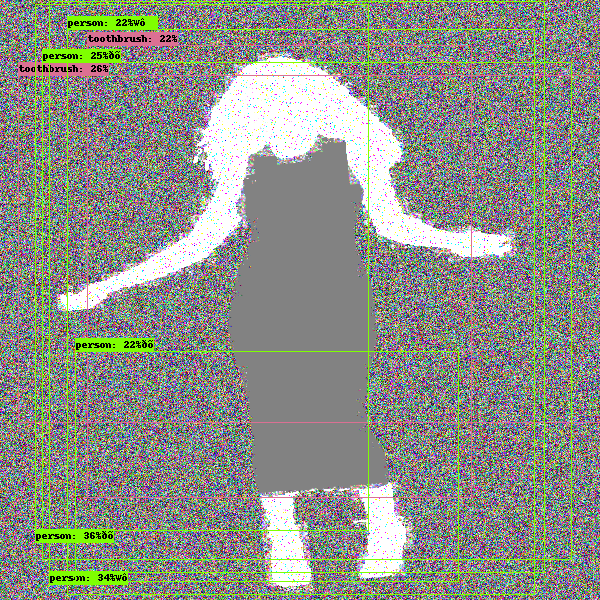

In [14]:
def create_target_labels(scores, from_class, to_class):
    target_labels = np.zeros_like(scores)
    classes = np.argmax(scores[:, :, 1:], axis=2)+1

    for i, _ in enumerate(classes):
        for j, cls in enumerate(classes[i]):
            cls = to_class # Just perturb all of them!
            target_labels[i, j, cls] = 1

    return target_labels

# use half white images and half random noise images as the background images for the optimization
white_imgs = np.ones((model.batch_size_ / 2, psize, psize, 3))
noisy_imgs = np.random.rand(model.batch_size_ / 2, psize, psize, 3) * 2 - 1.0
bg_imgs = np.concatenate([ noisy_imgs, white_imgs])

patch_transformations = np.zeros((model.batch_size_, 8))
for i in range(patch_transformations.shape[0]):
    patch_transformations[i, :] = model.generate_random_transformation()

_, scores, _ = model.inference(bg_imgs, patch_transformations)
target_labels = create_target_labels(scores, 13, TARGET_CLASS)

# Adjust hyperparameters

In [0]:
learning_rate = 1 #@param {type:"slider", min:0.1, max:10, step:0.1}
patch_loss_weight = 0.005 #@param {type:"slider", min:0, max:0.1, step:0.001}

# Run the optimization

In [0]:
model.reset_patch()

iter 0 total loss: 406.32925415 target loss: 108.488098145 patch loss: 59568.234375


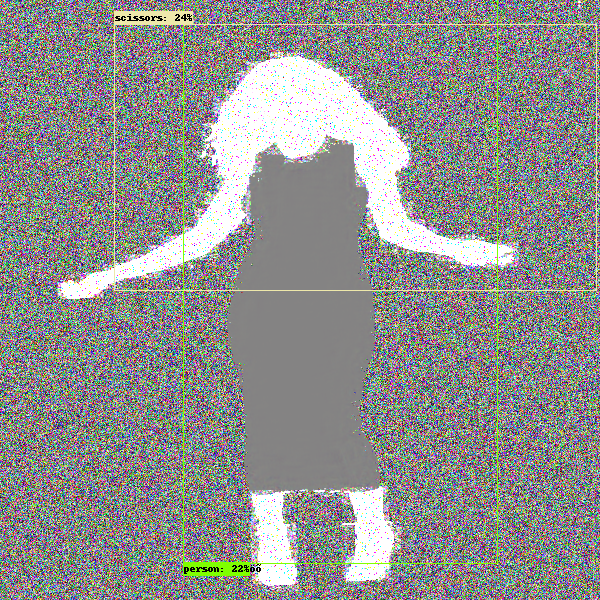

iter 50 total loss: 213.754379272 target loss: 23.5811214447 patch loss: 38034.6523438


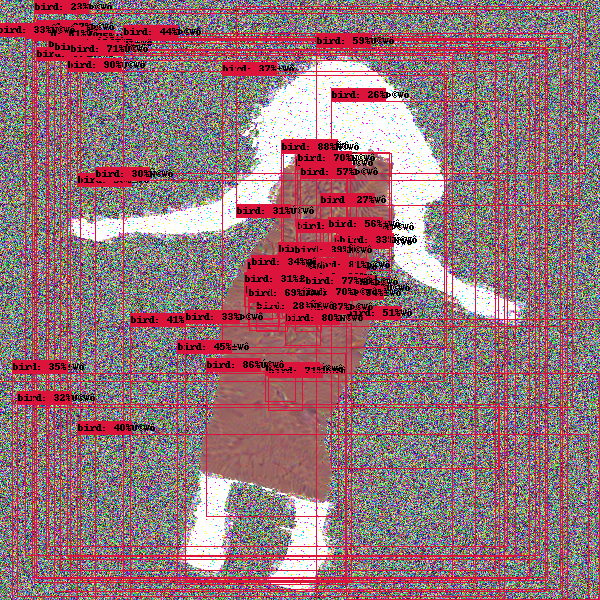

iter 100 total loss: 144.403152466 target loss: 17.0241966248 patch loss: 25475.7929688


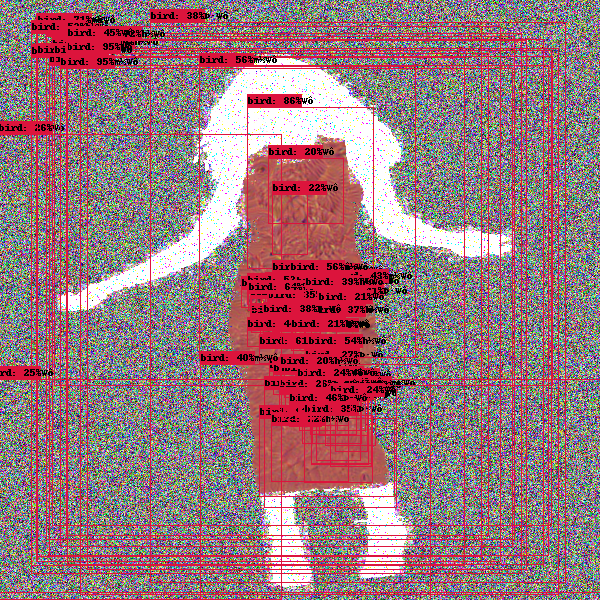

iter 150 total loss: 107.351699829 target loss: 16.0909919739 patch loss: 18252.140625


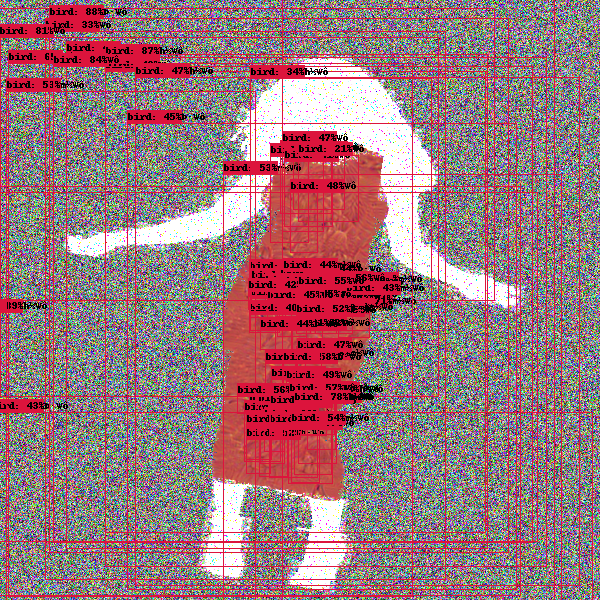

iter 200 total loss: 83.9377288818 target loss: 14.7334070206 patch loss: 13840.8642578


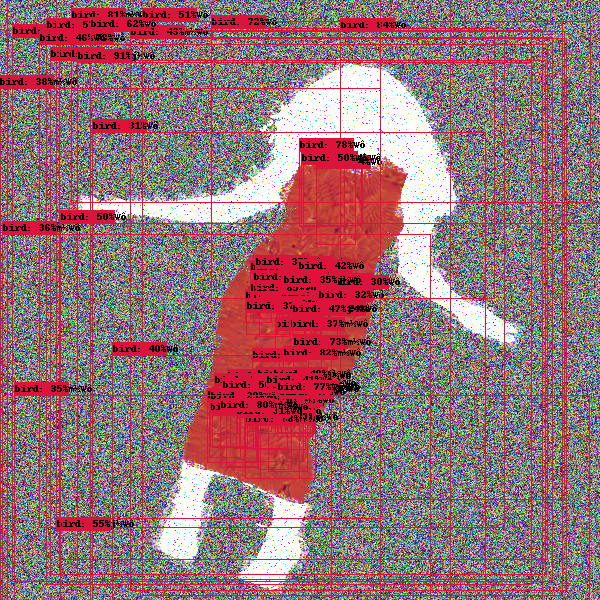

iter 250 total loss: 68.6847686768 target loss: 13.6572856903 patch loss: 11005.4970703


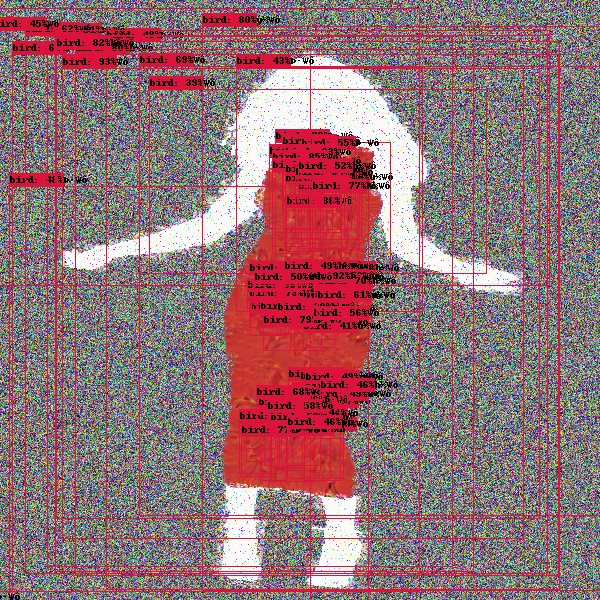

In [17]:
for i in range(251):
    try:
        # Generate random transformations
        for j in range(patch_transformations.shape[0]):
            patch_transformations[j, :] = model.generate_random_transformation(scale_min=0.05, scale_max=0.3)

        # Update patch according to changed labels
        loss, second_stage_cls_loss, patch_loss = model.train_step(bg_imgs,
                                                                   patch_transformations,
                                                                   target_labels,
                                                                   learning_rate=learning_rate,
                                                                   patch_loss_weight=patch_loss_weight)

        if (i % 50) == 0:
            print 'iter {} total loss: {} target loss: {} patch loss: {}'.format(i, loss, second_stage_cls_loss, patch_loss)
            model.inference(bg_imgs, patch_transformations)


    except KeyboardInterrupt:
        print 'iter {} total loss: {} target loss: {} patch loss: {}'.format(i, loss, second_stage_cls_loss, patch_loss)
        break

# Show the perturbation

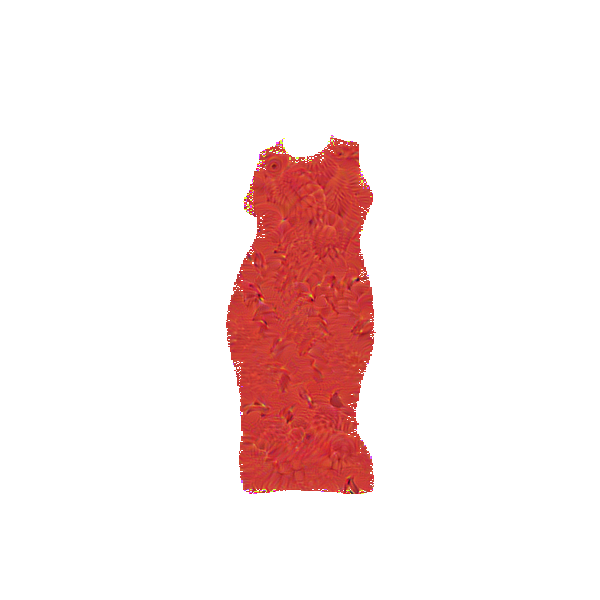

In [18]:
patch = model.get_patch()
showarray(PIL.Image.fromarray(patch))

# Test the perturbation

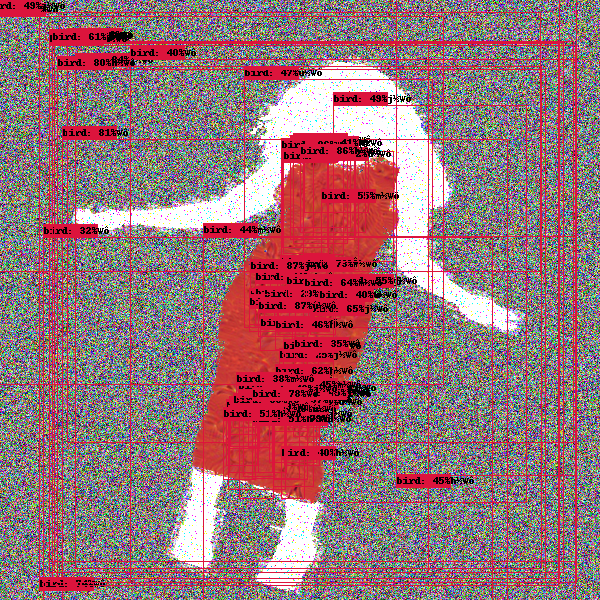

In [19]:
patch = model.get_patch()
for j in range(patch_transformations.shape[0]):
    patch_transformations[j, :] = model.generate_random_transformation(scale_min=0.05, scale_max=0.3)
_ = model.inference(bg_imgs, patch_transformations)

# Save the perturbation

In [0]:
PIL.Image.fromarray(patch).save('perturbation.png')